# Multilabel классификация

In [41]:
import random

from functools import partial
from IPython.display import display, HTML

from catboost import CatBoostClassifier
import matplotlib.pyplot as plt
import numpy as np
import optuna
from pandarallel import pandarallel
import pandas as pd
import seaborn as sns
from sklearn.metrics import f1_score, roc_curve, precision_recall_curve, auc, average_precision_score
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.multioutput import MultiOutputClassifier
from sklearn.svm import LinearSVC
from sklearn.naive_bayes import MultinomialNB

pd.options.display.float_format = '{:.2f}'.format
pandarallel.initialize(progress_bar=True)
random.seed(42)
np.random.seed(42)

INFO: Pandarallel will run on 8 workers.
INFO: Pandarallel will use standard multiprocessing data transfer (pipe) to transfer data between the main process and workers.


In [2]:
df = pd.read_csv('modified_train.csv', index_col=0)

In [3]:
df['created_date'] = pd.to_datetime(df['created_date'], format='ISO8601')

In [4]:
df = df[df['created_date'] >= '2016-04-01']

In [5]:
# Сортировка данных для дальнейшего разделения по временной метке
df = df.sort_values('created_date').reset_index(drop=True)

In [6]:
df[df.toxicity_b == 0].shape

(1585541, 38)

In [7]:
df[df.toxicity_b == 1].shape

(199767, 38)

In [8]:
print('Процентное соотношение значений ' + str(df['toxicity_b'].value_counts(normalize=True) * 100))

Процентное соотношение значений toxicity_b
0   88.81
1   11.19
Name: proportion, dtype: float64


In [9]:
df['ctws'].fillna('', inplace=True)

/var/folders/hr/sq9687tj13d9h3kr4gw5mrz80000gn/T/ipykernel_60778/3616255057.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['ctws'].fillna('', inplace=True)


In [10]:
labels = ['toxicity_b', 'obscene_b', 'identity_attack_b', 'insult_b', 'threat_b', 'sexual_explicit_b']

In [11]:
split_date = df.iloc[int(len(df) * 0.8)]['created_date']
split_date

Timestamp('2017-09-03 13:54:26.194849+0000', tz='UTC')

In [12]:
train_val_df = df[df['created_date'] <= split_date]
test_df = df[df['created_date'] > split_date]

In [13]:
X_test = test_df['ctws']
y_test = test_df[labels]

In [14]:
split_date = train_val_df.iloc[int(len(train_val_df) * 0.8)]['created_date']
split_date

Timestamp('2017-07-06 03:02:41.334553+0000', tz='UTC')

In [15]:
train_df = train_val_df[train_val_df['created_date'] <= split_date]
val_df = train_val_df[train_val_df['created_date'] > split_date]

In [16]:
X_train = train_df['ctws']
y_train = train_df[labels]

In [17]:
X_val = val_df['ctws']
y_val= val_df[labels]

In [18]:
y_train.mean(), y_test.mean(), y_val.mean()

(toxicity_b          0.11
 obscene_b           0.01
 identity_attack_b   0.01
 insult_b            0.08
 threat_b            0.00
 sexual_explicit_b   0.00
 dtype: float64,
 toxicity_b          0.12
 obscene_b           0.01
 identity_attack_b   0.02
 insult_b            0.09
 threat_b            0.00
 sexual_explicit_b   0.01
 dtype: float64,
 toxicity_b          0.12
 obscene_b           0.01
 identity_attack_b   0.02
 insult_b            0.09
 threat_b            0.00
 sexual_explicit_b   0.00
 dtype: float64)

In [62]:
from sklearn.metrics import classification_report

def train_and_predict_toxicity_multilabel(model, X_train, X_val, X_test, y_train):
    clf = MultiOutputClassifier(model, n_jobs=-1)
    clf.fit(X_train, y_train)

    y_pred_train = clf.predict(X_train)
    y_pred_val = clf.predict(X_val)
    y_pred_test = clf.predict(X_test)

    if hasattr(model, 'predict_proba'):
        y_pred_proba_train = np.array([arr[:, 1] for arr in clf.predict_proba(X_train)]).T
        y_pred_proba_val = np.array([arr[:, 1] for arr in clf.predict_proba(X_val)]).T
        y_pred_proba_test = np.array([arr[:, 1] for arr in clf.predict_proba(X_test)]).T
    elif hasattr(model, 'decision_function'):
        y_pred_proba_train = np.array([estimator.decision_function(X_train) for estimator in clf.estimators_]).T
        y_pred_proba_val = np.array([estimator.decision_function(X_val) for estimator in clf.estimators_]).T
        y_pred_proba_test = np.array([estimator.decision_function(X_test) for estimator in clf.estimators_]).T
    else:
        y_pred_proba_train = []
        y_pred_proba_val = []
        y_pred_proba_test = []

    return y_pred_train, y_pred_val, y_pred_test, y_pred_proba_train, y_pred_proba_val, y_pred_proba_test

def plot_metrics_multi(
    y_train, y_val, y_test,
    y_pred_train, y_pred_val, y_pred_test,
    y_pred_proba_train, y_pred_proba_val, y_pred_proba_test,
    label_names, model_name
):
    y_pred_dict = {
        'train': y_pred_train,
        'train_proba': y_pred_proba_train,
        'val': y_pred_val,
        'val_proba': y_pred_proba_val,
        'test': y_pred_test,
        'test_proba': y_pred_proba_test
    }

    y_true_dict = {
        'train': y_train,
        'val': y_val,
        'test': y_test
    }

    def plot_metrics_table(y_true, y_pred, set_type, ax):
        tbl = pd.DataFrame.from_dict(classification_report(y_true, y_pred, zero_division=np.nan, target_names=label_names, output_dict=True)) \
            .drop(['weighted avg', 'samples avg'], axis=1) \
            .T \
            .astype('float64') \
            .apply(lambda s: s.apply('{:,.0f}'.format) if s.name=='support' else s.apply('{:.2f}'.format), axis=0)
        ax_tbl = ax.table(cellText=tbl.values, rowLabels=tbl.index.values, colLabels=tbl.columns.values, loc='center')
        ax_tbl.auto_set_font_size(False)
        ax_tbl.set_fontsize('small')
        ax.axis('off')
        ax_tbl.scale(1, 0.7)

        if set_type=='train':
            title = 'TRAIN'
        elif set_type=='val':
            title = 'VALIDATION'
        else:
            title = 'TEST'
            
        ax.set_title(title, loc='left')

    def plot_roc_curve(y_true, y_pred_proba, ax):
        for i, label in enumerate(label_names):
            fpr, tpr, _ = roc_curve(y_true[:,i], y_pred_proba[:,i])
            ax.plot(fpr, tpr, label=f'ROC for {label}, AUC={auc(fpr, tpr):.2f}')

        fpr_micro, tpr_micro, _ = roc_curve(y_true.ravel(), y_pred_proba.ravel())
        ax.plot(fpr_micro, tpr_micro, '--', label=f'micro-average ROC curve, AUC={auc(fpr_micro, tpr_micro):.2f}')

        ax.plot([0, 1], [0, 1], 'k--', lw=0.5, label='Chance level, AUC=0.5')

        ax.set_xlabel('FPR')
        ax.set_ylabel('TPR')
        ax.legend(fontsize='x-small', loc='lower right')
        ax.set_title(f'ROC', loc='left', fontsize='small')
        ax.grid()
        ax.set_ylim(bottom=0, top=1)
        ax.set_xlim(left=0, right=1)

    def plot_pr_curve(y_true, y_pred_proba, ax):
        for i, label in enumerate(label_names):
            prec, rec, _ = precision_recall_curve(y_true[:,i], y_pred_proba[:,i])
            sorted_index = np.argsort(rec)
            prec = prec[sorted_index]
            rec = rec[sorted_index]
            ax.plot(rec, prec, label=f'P-R for {label}, AUC={auc(rec, prec):.2f}, AP={average_precision_score(y_true[:,i], y_pred_proba[:,i]):.2f}')

        prec_micro, rec_micro, _ = precision_recall_curve(y_true.ravel(), y_pred_proba.ravel())
        sorted_index = np.argsort(rec_micro)
        prec_micro = prec_micro[sorted_index]
        rec_micro = rec_micro[sorted_index]
        ax.plot(
            rec_micro, prec_micro, '--',
            label=(
                f'micro-average PR curve, '
                f'AUC={auc(rec_micro, prec_micro):.2f}, '
                f'AP={average_precision_score(y_true, y_pred_proba, average="micro"):.2f}'
            )
        )

        f_scores = np.linspace(0.2, 0.8, num=4)
        for f_score in f_scores:
            x = np.linspace(0.01, 1)
            y = f_score * x / (2 * x - f_score)
            (l,) = ax.plot(x[y >= 0], y[y >= 0], color='gray', alpha=0.2)
            ax.annotate(f'f1={f_score:0.1f}', xy=(0.9, y[45] + 0.02), fontsize='x-small')

        ax.set_ylim(bottom=0, top=1)
        ax.set_xlim(left=0, right=1)

        handles, labels = ax.get_legend_handles_labels()
        handles.extend([l])
        labels.extend(['iso f1 curves'])
        ax.legend(handles=handles, labels=labels, loc='best', fontsize='x-small')
        ax.set_xlabel('Recall')
        ax.set_ylabel('Precision')
        ax.set_title(f'Precision-Recall', loc='left', fontsize='small')
        ax.grid()
    
    fig = plt.figure(figsize=(16, 11), layout='constrained')
    gs = fig.add_gridspec(3, 3, height_ratios=[0.18, 0.41, 0.41])
    nrows, ncols = gs.get_geometry()
    ax = [[fig.add_subplot(gs[row, col]) for col in range(ncols)] for row in range(nrows)]

    for colnum, set_type in enumerate(['train', 'val', 'test']):
        plot_metrics_table(y_true_dict[set_type], y_pred_dict[set_type], set_type, ax[0][colnum])
        plot_roc_curve(y_true_dict[set_type].values, y_pred_dict[set_type+'_proba'], ax[1][colnum])
        plot_pr_curve(y_true_dict[set_type].values, y_pred_dict[set_type+'_proba'], ax[2][colnum])

    fig.suptitle(f'Multilabel classification metrics for {model_name}')

In [20]:
# Функция получеия мешка слов
def get_bows(X_train, X_val, X_test, ngram_range=(1, 1)):
    vectorizer = CountVectorizer(ngram_range=ngram_range)
    return vectorizer.fit_transform(X_train), vectorizer.transform(X_val), vectorizer.transform(X_test)


# Векторизация  TF-IDF
def get_tfidf(X_train, X_val, X_test, ngram_range=(1, 1)):
    vectorizer = TfidfVectorizer(ngram_range=ngram_range)
    return vectorizer.fit_transform(X_train), vectorizer.transform(X_val), vectorizer.transform(X_test)

In [21]:
X_train_bow, X_val_bow, X_test_bow = get_bows(X_train, X_val, X_test)

In [22]:
X_train_tfidf, X_val_tfidf, X_test_tfidf = get_tfidf(X_train, X_val, X_test)

In [23]:
X_train_bow_ngrams, X_val_bow_ngrams, X_test_bow_ngrams = get_bows(X_train, X_val, X_test, ngram_range=(1, 2))

In [24]:
X_train_tfidf_ngrams, X_val_tfidf_ngrams, X_test_tfidf_ngrams = get_tfidf(X_train, X_val, X_test, ngram_range=(1, 2))

## Обучение с дефолтными параметрами моделей

### Обучение с мешком слов

#### Логистическая регрессия

In [45]:
(
    y_default_log_reg_bow_pred_train,
    y_default_log_reg_bow_pred_val,
    y_default_log_reg_bow_pred_test,
    y_default_log_reg_bow_pred_proba_train,
    y_default_log_reg_bow_pred_proba_val,
    y_default_log_reg_bow_pred_proba_test
) = train_and_predict_toxicity_multilabel(
    model=LogisticRegression(),
    X_train=X_train_bow,
    X_val=X_val_bow,
    X_test=X_test_bow,
    y_train=y_train,
)

/Users/lev_k/HSE/YP/.venv/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/lev_k/HSE/YP/.venv/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logis

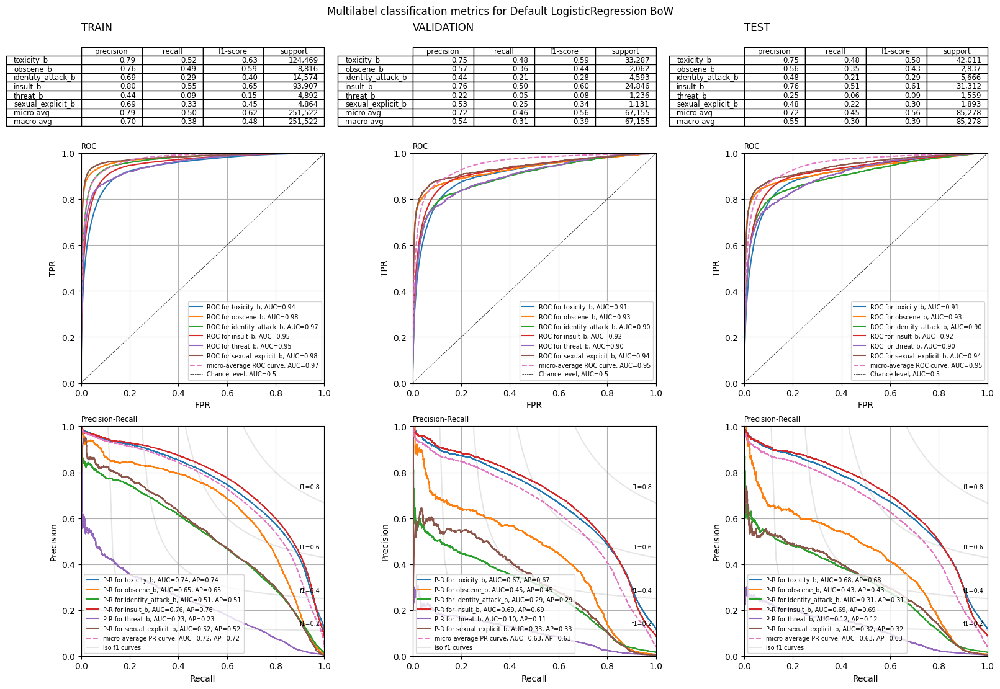

In [55]:
plot_metrics_multi(
    y_train,
    y_val,
    y_test,
    y_default_log_reg_bow_pred_train,
    y_default_log_reg_bow_pred_val,
    y_default_log_reg_bow_pred_test,
    y_default_log_reg_bow_pred_proba_train,
    y_default_log_reg_bow_pred_proba_val,
    y_default_log_reg_bow_pred_proba_test,
    y_train.columns,
    'Default LogisticRegression BoW'
)

#### SVM

In [ ]:
(
    y_default_svm_bow_pred_train,
    y_default_svm_bow_pred_val,
    y_default_svm_bow_pred_test,
    y_default_svm_bow_pred_proba_train,
    y_default_svm_bow_pred_proba_val,
    y_default_svm_bow_pred_proba_test
) = train_and_predict_toxicity_multilabel(
    model=LinearSVC(),
    X_train=X_train_bow,
    X_val=X_val_bow,
    X_test=X_test_bow,
    y_train=y_train,
)

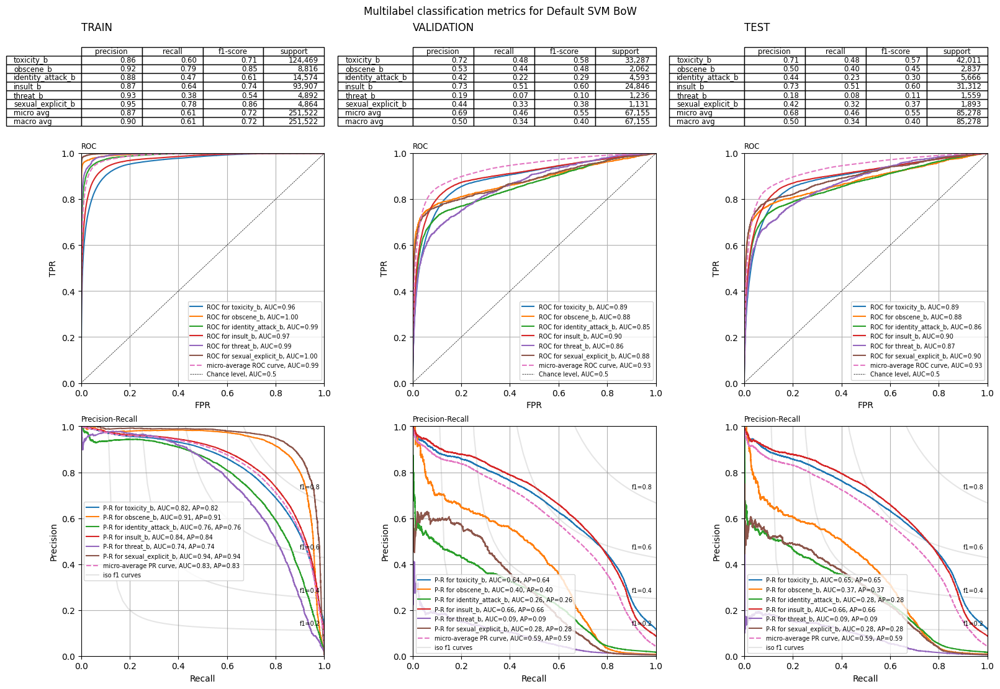

In [64]:
plot_metrics_multi(
    y_train,
    y_val,
    y_test,
    y_default_svm_bow_pred_train,
    y_default_svm_bow_pred_val,
    y_default_svm_bow_pred_test,
    y_default_svm_bow_pred_proba_train,
    y_default_svm_bow_pred_proba_val,
    y_default_svm_bow_pred_proba_test,
    y_train.columns,
    'Default SVM BoW'
)

#### Наивный Байес

##### Слова

In [ ]:
(
    y_default_nb_bow_pred_train,
    y_default_nb_bow_pred_val,
    y_default_nb_bow_pred_test,
    y_default_nb_bow_pred_proba_train,
    y_default_nb_bow_pred_proba_val,
    y_default_nb_bow_pred_proba_test
) = train_and_predict_toxicity_multilabel(
    model=MultinomialNB(),
    X_train=X_train_bow,
    X_val=X_val_bow,
    X_test=X_test_bow,
    y_train=y_train,
)

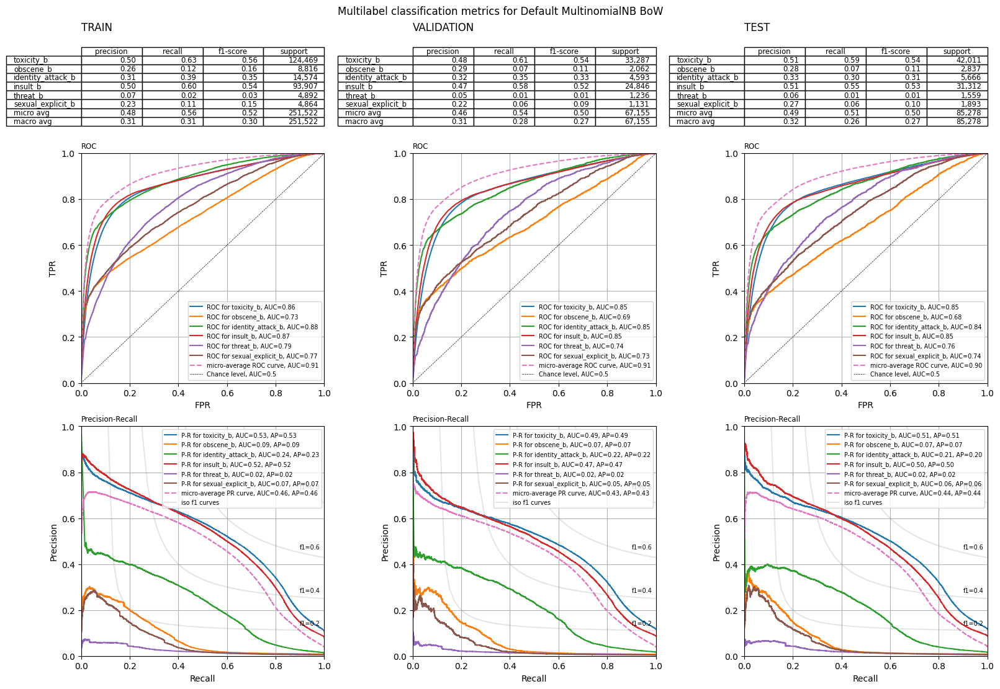

In [66]:
plot_metrics_multi(
    y_train,
    y_val,
    y_test,
    y_default_nb_bow_pred_train,
    y_default_nb_bow_pred_val,
    y_default_nb_bow_pred_test,
    y_default_nb_bow_pred_proba_train,
    y_default_nb_bow_pred_proba_val,
    y_default_nb_bow_pred_proba_test,
    y_train.columns,
    'Default MultinomialNB BoW'
)

##### Биграммы

In [132]:
(
    y_default_nb_bow_ngrams_pred_train,
    y_default_nb_bow_ngrams_pred_val,
    y_default_nb_bow_ngrams_pred_test,
    y_default_nb_bow_ngrams_pred_proba_train,
    y_default_nb_bow_ngrams_pred_proba_val,
    y_default_nb_bow_ngrams_pred_proba_test
) = train_and_predict_toxicity_multilabel(
    model=MultinomialNB(),
    X_train=X_train_bow_ngrams,
    X_val=X_val_bow_ngrams,
    X_test=X_test_bow_ngrams,
    y_train=y_train,
)

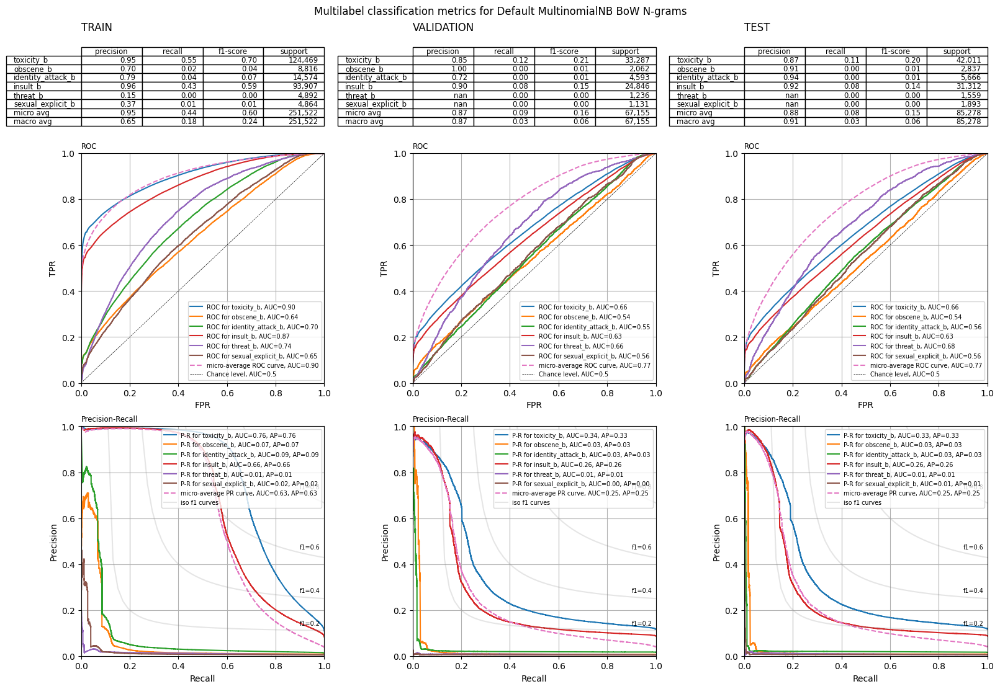

In [133]:
plot_metrics_multi(
    y_train,
    y_val,
    y_test,
    y_default_nb_bow_ngrams_pred_train,
    y_default_nb_bow_ngrams_pred_val,
    y_default_nb_bow_ngrams_pred_test,
    y_default_nb_bow_ngrams_pred_proba_train,
    y_default_nb_bow_ngrams_pred_proba_val,
    y_default_nb_bow_ngrams_pred_proba_test,
    y_train.columns,
    'Default MultinomialNB BoW N-grams'
)

### Обучение с TF-IDF

#### Логистическая регрессия

In [70]:
(
    y_default_log_reg_tfidf_pred_train,
    y_default_log_reg_tfidf_pred_val,
    y_default_log_reg_tfidf_pred_test,
    y_default_log_reg_tfidf_pred_proba_train,
    y_default_log_reg_tfidf_pred_proba_val,
    y_default_log_reg_tfidf_pred_proba_test
) = train_and_predict_toxicity_multilabel(
    model=LogisticRegression(),
    X_train=X_train_tfidf,
    X_val=X_val_tfidf,
    X_test=X_test_tfidf,
    y_train=y_train,
)

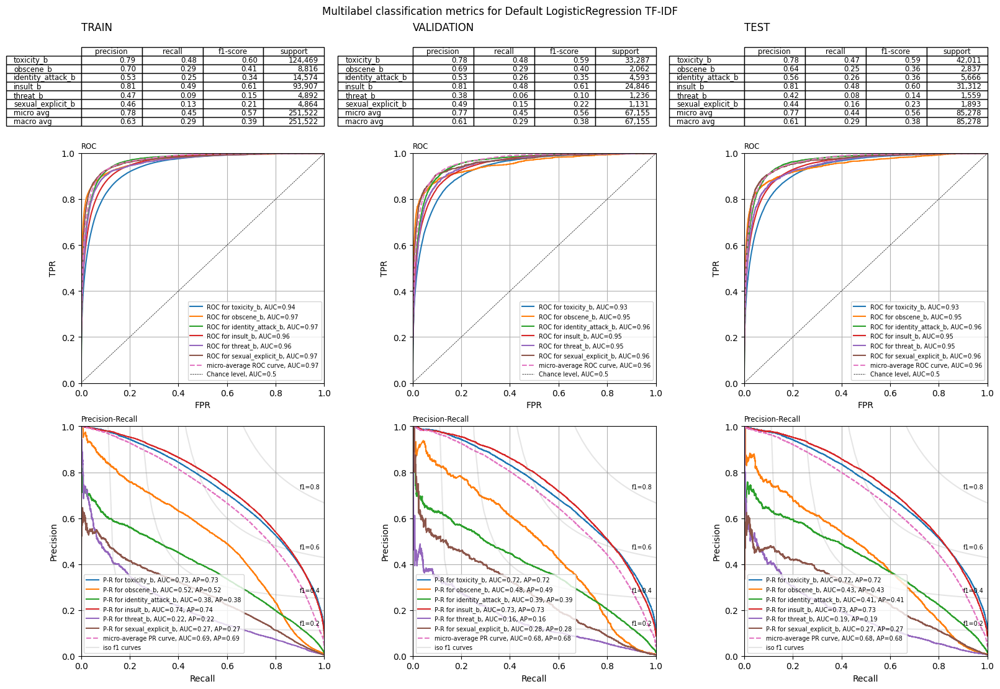

In [71]:
plot_metrics_multi(
    y_train,
    y_val,
    y_test,
    y_default_log_reg_tfidf_pred_train,
    y_default_log_reg_tfidf_pred_val,
    y_default_log_reg_tfidf_pred_test,
    y_default_log_reg_tfidf_pred_proba_train,
    y_default_log_reg_tfidf_pred_proba_val,
    y_default_log_reg_tfidf_pred_proba_test,
    y_train.columns,
    'Default LogisticRegression TF-IDF'
)

#### SVM

In [ ]:
(
    y_default_svm_tfidf_pred_train,
    y_default_svm_tfidf_pred_val,
    y_default_svm_tfidf_pred_test,
    y_default_svm_tfidf_pred_proba_train,
    y_default_svm_tfidf_pred_proba_val,
    y_default_svm_tfidf_pred_proba_test
) = train_and_predict_toxicity_multilabel(
    model=LinearSVC(),
    X_train=X_train_tfidf,
    X_val=X_val_tfidf,
    X_test=X_test_tfidf,
    y_train=y_train,
)

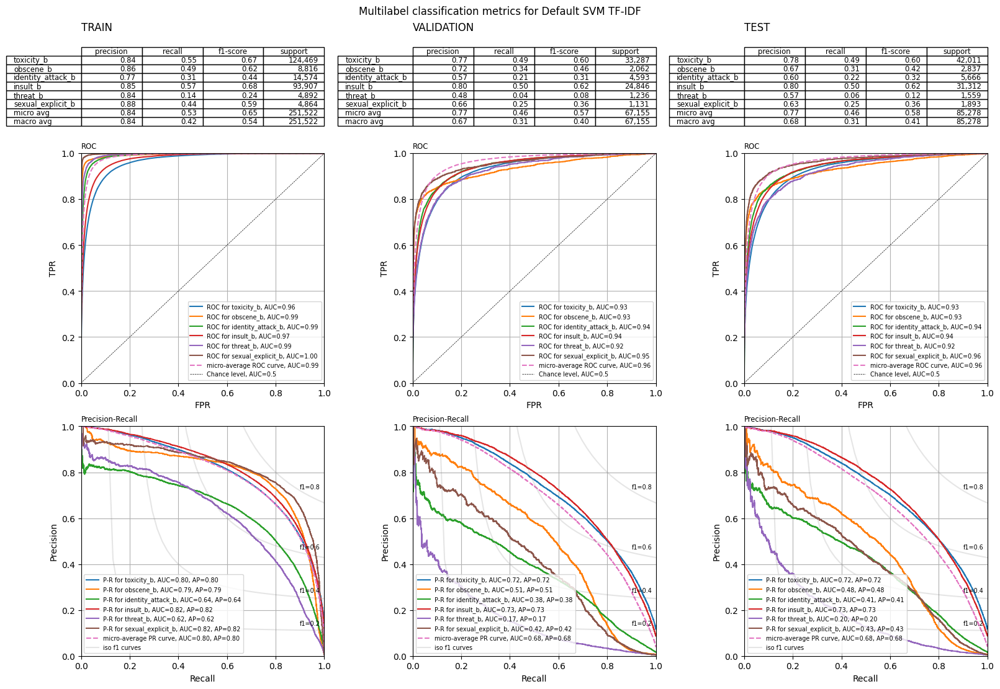

In [73]:
plot_metrics_multi(
    y_train,
    y_val,
    y_test,
    y_default_svm_tfidf_pred_train,
    y_default_svm_tfidf_pred_val,
    y_default_svm_tfidf_pred_test,
    y_default_svm_tfidf_pred_proba_train,
    y_default_svm_tfidf_pred_proba_val,
    y_default_svm_tfidf_pred_proba_test,
    y_train.columns,
    'Default SVM TF-IDF'
)

#### Наивный Байес

##### Слова

In [ ]:
(
    y_default_nb_tfidf_pred_train,
    y_default_nb_tfidf_pred_val,
    y_default_nb_tfidf_pred_test,
    y_default_nb_tfidf_pred_proba_train,
    y_default_nb_tfidf_pred_proba_val,
    y_default_nb_tfidf_pred_proba_test
) = train_and_predict_toxicity_multilabel(
    model=MultinomialNB(),
    X_train=X_train_tfidf,
    X_val=X_val_tfidf,
    X_test=X_test_tfidf,
    y_train=y_train,
)

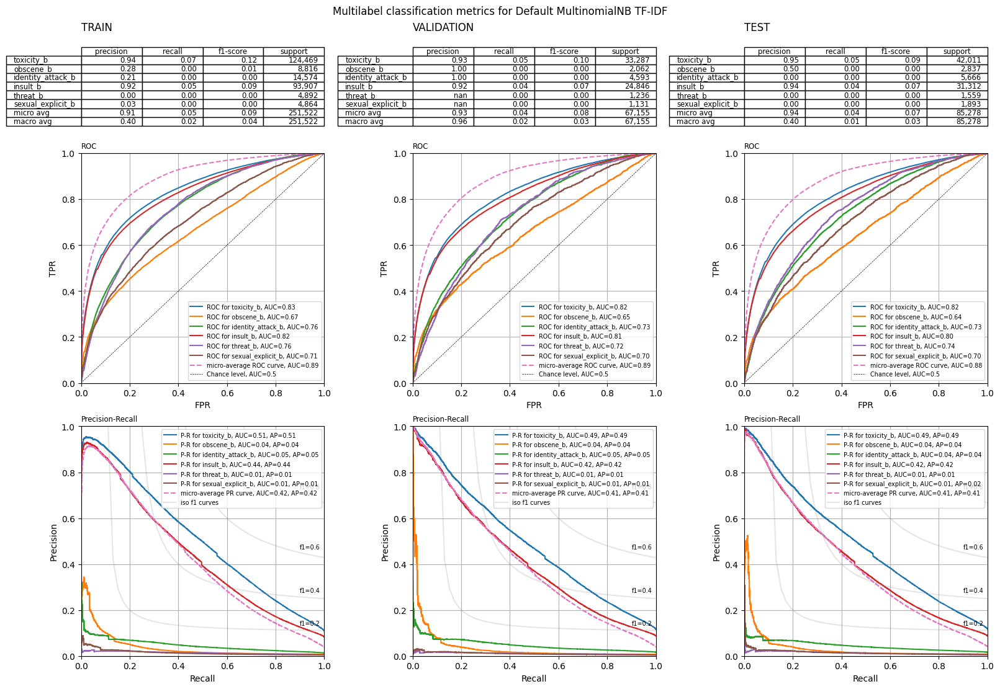

In [75]:
plot_metrics_multi(
    y_train,
    y_val,
    y_test,
    y_default_nb_tfidf_pred_train,
    y_default_nb_tfidf_pred_val,
    y_default_nb_tfidf_pred_test,
    y_default_nb_tfidf_pred_proba_train,
    y_default_nb_tfidf_pred_proba_val,
    y_default_nb_tfidf_pred_proba_test,
    y_train.columns,
    'Default MultinomialNB TF-IDF'
)

##### Биграммы

In [134]:
(
    y_default_nb_tfidf_ngrams_pred_train,
    y_default_nb_tfidf_ngrams_pred_val,
    y_default_nb_tfidf_ngrams_pred_test,
    y_default_nb_tfidf_ngrams_pred_proba_train,
    y_default_nb_tfidf_ngrams_pred_proba_val,
    y_default_nb_tfidf_ngrams_pred_proba_test
) = train_and_predict_toxicity_multilabel(
    model=MultinomialNB(),
    X_train=X_train_tfidf_ngrams,
    X_val=X_val_tfidf_ngrams,
    X_test=X_test_tfidf_ngrams,
    y_train=y_train,
)

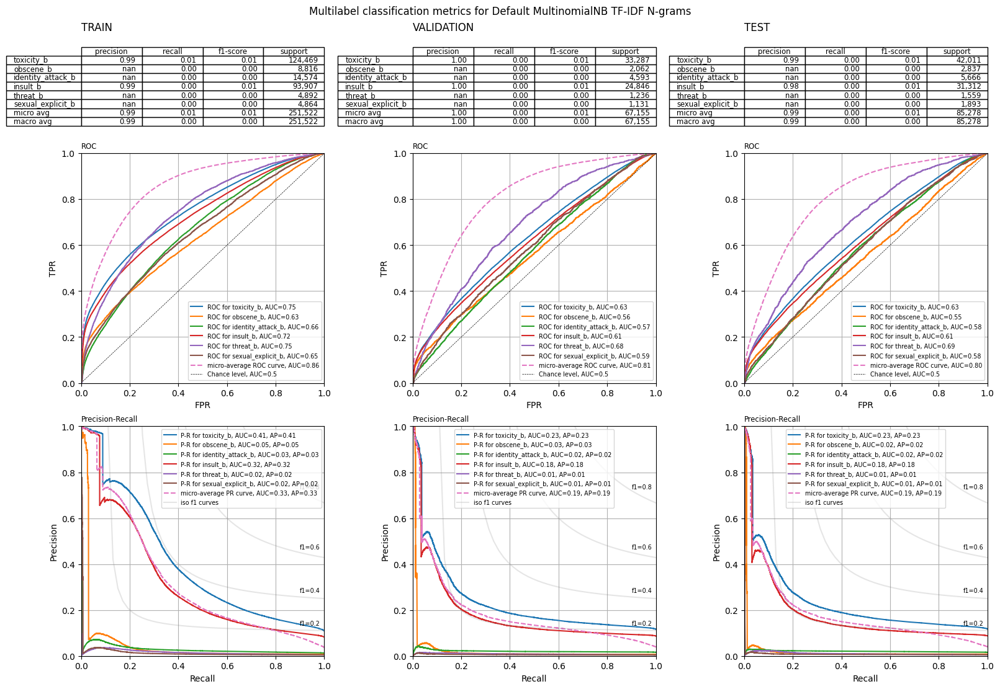

In [135]:
plot_metrics_multi(
    y_train,
    y_val,
    y_test,
    y_default_nb_tfidf_ngrams_pred_train,
    y_default_nb_tfidf_ngrams_pred_val,
    y_default_nb_tfidf_ngrams_pred_test,
    y_default_nb_tfidf_ngrams_pred_proba_train,
    y_default_nb_tfidf_ngrams_pred_proba_val,
    y_default_nb_tfidf_ngrams_pred_proba_test,
    y_train.columns,
    'Default MultinomialNB TF-IDF N-grams'
)

## Обучение с заданными параметрами

### Обучение с мешком слов

#### Логистическая регрессия

In [100]:
log_reg_bow_handle_params = {'C': 0.1, 'max_iter': 1000}
(
    y_handle_params_log_reg_bow_pred_train,
    y_handle_params_log_reg_bow_pred_val,
    y_handle_params_log_reg_bow_pred_test,
    y_handle_params_log_reg_bow_pred_proba_train,
    y_handle_params_log_reg_bow_pred_proba_val,
    y_handle_params_log_reg_bow_pred_proba_test
) = train_and_predict_toxicity_multilabel(
    model=LogisticRegression(**log_reg_bow_handle_params),
    X_train=X_train_bow,
    X_val=X_val_bow,
    X_test=X_test_bow,
    y_train=y_train,
)

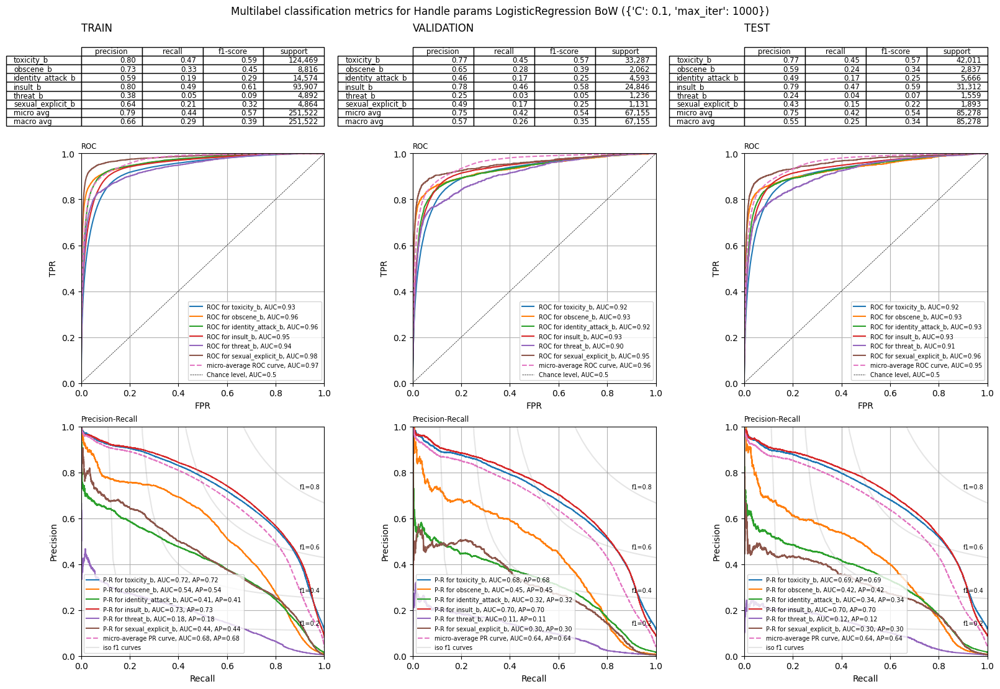

In [101]:
plot_metrics_multi(
    y_train,
    y_val,
    y_test,
    y_handle_params_log_reg_bow_pred_train,
    y_handle_params_log_reg_bow_pred_val,
    y_handle_params_log_reg_bow_pred_test,
    y_handle_params_log_reg_bow_pred_proba_train,
    y_handle_params_log_reg_bow_pred_proba_val,
    y_handle_params_log_reg_bow_pred_proba_test,
    y_train.columns,
    f'Handle params LogisticRegression BoW ({log_reg_bow_handle_params})'
)

#### SVM

In [102]:
svm_bow_handle_params = {'C': 0.01, 'dual': False}
(
    y_handle_params_svm_bow_pred_train,
    y_handle_params_svm_bow_pred_val,
    y_handle_params_svm_bow_pred_test,
    y_handle_params_svm_bow_pred_proba_train,
    y_handle_params_svm_bow_pred_proba_val,
    y_handle_params_svm_bow_pred_proba_test
) = train_and_predict_toxicity_multilabel(
    model=LinearSVC(**svm_bow_handle_params),
    X_train=X_train_bow,
    X_val=X_val_bow,
    X_test=X_test_bow,
    y_train=y_train,
)

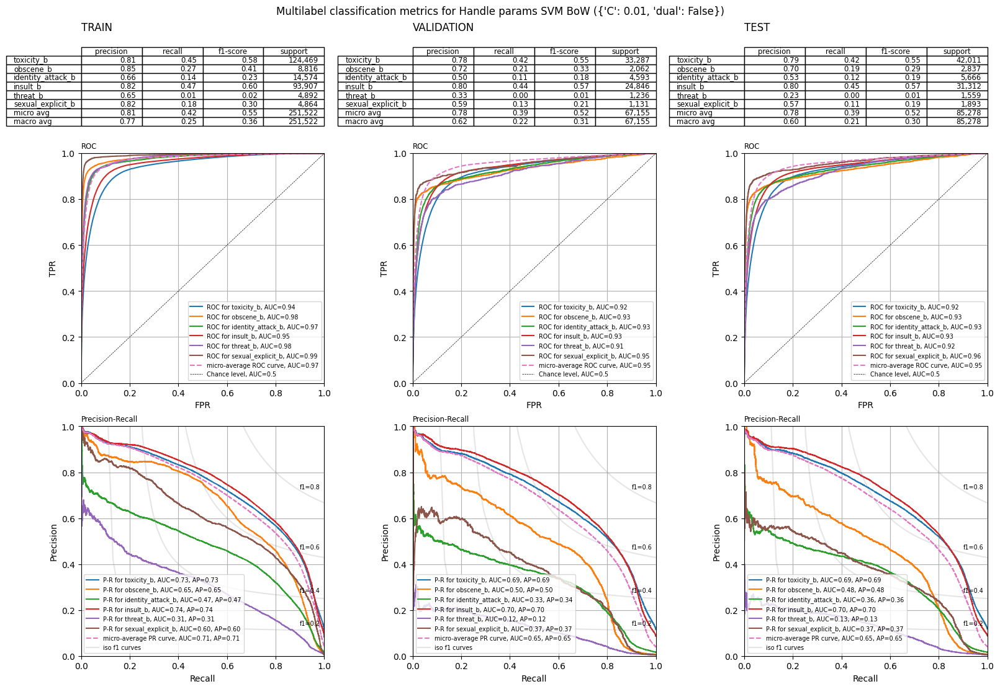

In [103]:
plot_metrics_multi(
    y_train,
    y_val,
    y_test,
    y_handle_params_svm_bow_pred_train,
    y_handle_params_svm_bow_pred_val,
    y_handle_params_svm_bow_pred_test,
    y_handle_params_svm_bow_pred_proba_train,
    y_handle_params_svm_bow_pred_proba_val,
    y_handle_params_svm_bow_pred_proba_test,
    y_train.columns,
    f'Handle params SVM BoW ({svm_bow_handle_params})'
)

#### Наивный Байес

##### Слова

In [104]:
nb_bow_handle_params = {'alpha': 0.5}
(
    y_handle_params_nb_bow_pred_train,
    y_handle_params_nb_bow_pred_val,
    y_handle_params_nb_bow_pred_test,
    y_handle_params_nb_bow_pred_proba_train,
    y_handle_params_nb_bow_pred_proba_val,
    y_handle_params_nb_bow_pred_proba_test
) = train_and_predict_toxicity_multilabel(
    model=MultinomialNB(**nb_bow_handle_params),
    X_train=X_train_bow,
    X_val=X_val_bow,
    X_test=X_test_bow,
    y_train=y_train,
)

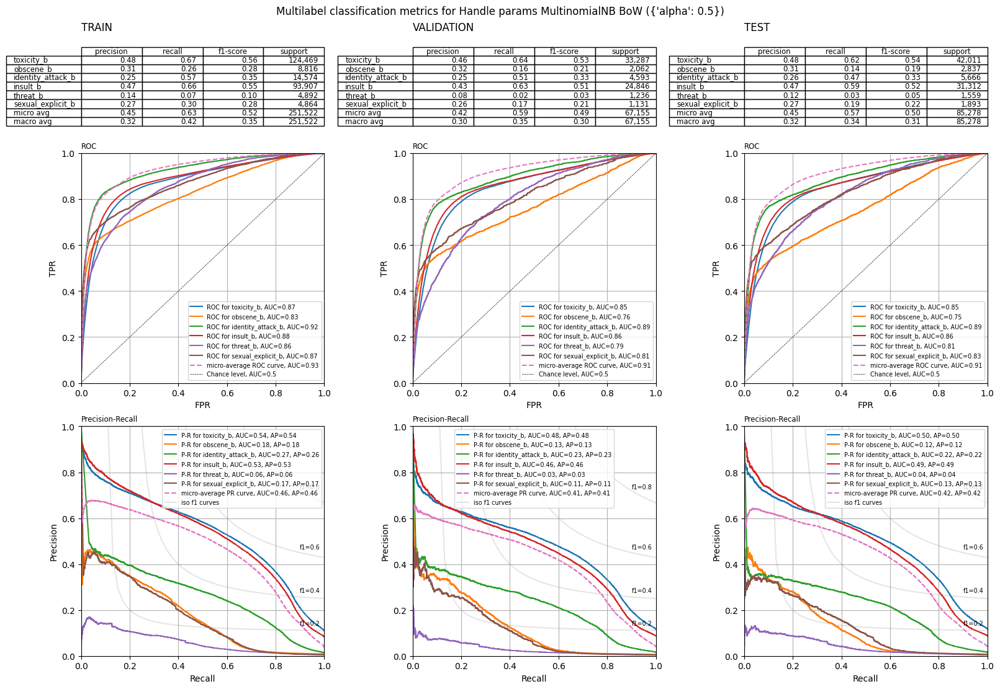

In [105]:
plot_metrics_multi(
    y_train,
    y_val,
    y_test,
    y_handle_params_nb_bow_pred_train,
    y_handle_params_nb_bow_pred_val,
    y_handle_params_nb_bow_pred_test,
    y_handle_params_nb_bow_pred_proba_train,
    y_handle_params_nb_bow_pred_proba_val,
    y_handle_params_nb_bow_pred_proba_test,
    y_train.columns,
    f'Handle params MultinomialNB BoW ({nb_bow_handle_params})'
)

##### Биграммы

In [136]:
nb_bow_ngrams_handle_params = {'alpha': 0.5}
(
    y_handle_params_nb_bow_ngrams_pred_train,
    y_handle_params_nb_bow_ngrams_pred_val,
    y_handle_params_nb_bow_ngrams_pred_test,
    y_handle_params_nb_bow_ngrams_pred_proba_train,
    y_handle_params_nb_bow_ngrams_pred_proba_val,
    y_handle_params_nb_bow_ngrams_pred_proba_test
) = train_and_predict_toxicity_multilabel(
    model=MultinomialNB(**nb_bow_ngrams_handle_params),
    X_train=X_train_bow_ngrams,
    X_val=X_val_bow_ngrams,
    X_test=X_test_bow_ngrams,
    y_train=y_train,
)

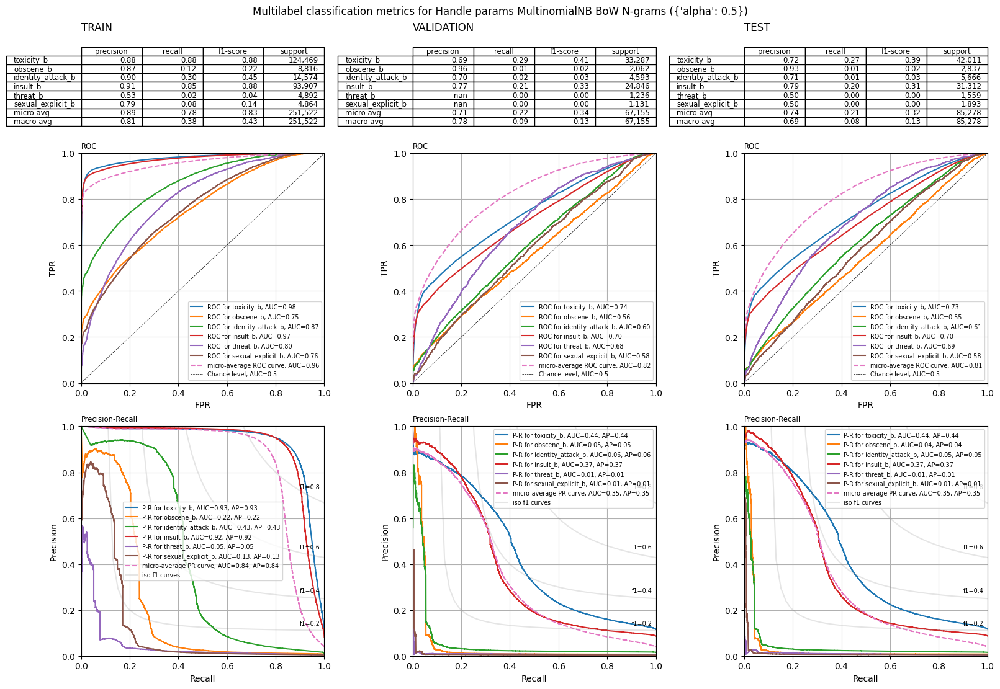

In [137]:
plot_metrics_multi(
    y_train,
    y_val,
    y_test,
    y_handle_params_nb_bow_ngrams_pred_train,
    y_handle_params_nb_bow_ngrams_pred_val,
    y_handle_params_nb_bow_ngrams_pred_test,
    y_handle_params_nb_bow_ngrams_pred_proba_train,
    y_handle_params_nb_bow_ngrams_pred_proba_val,
    y_handle_params_nb_bow_ngrams_pred_proba_test,
    y_train.columns,
    f'Handle params MultinomialNB BoW N-grams ({nb_bow_ngrams_handle_params})'
)

### Обучение с TF-IDF

#### Логистическая регрессия

In [118]:
log_reg_tfidf_handle_params = {'C': 0.1, 'max_iter': 1000}
(
    y_handle_params_log_reg_tfidf_pred_train,
    y_handle_params_log_reg_tfidf_pred_val,
    y_handle_params_log_reg_tfidf_pred_test,
    y_handle_params_log_reg_tfidf_pred_proba_train,
    y_handle_params_log_reg_tfidf_pred_proba_val,
    y_handle_params_log_reg_tfidf_pred_proba_test
) = train_and_predict_toxicity_multilabel(
    model=LogisticRegression(**log_reg_tfidf_handle_params),
    X_train=X_train_tfidf,
    X_val=X_val_tfidf,
    X_test=X_test_tfidf,
    y_train=y_train,
)

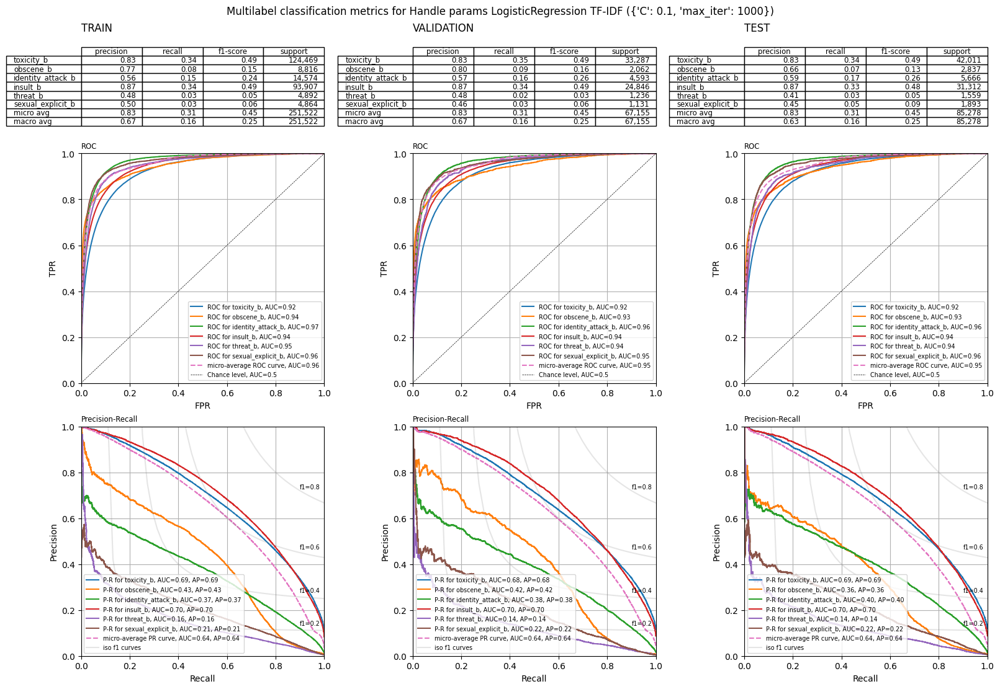

In [119]:
plot_metrics_multi(
    y_train,
    y_val,
    y_test,
    y_handle_params_log_reg_tfidf_pred_train,
    y_handle_params_log_reg_tfidf_pred_val,
    y_handle_params_log_reg_tfidf_pred_test,
    y_handle_params_log_reg_tfidf_pred_proba_train,
    y_handle_params_log_reg_tfidf_pred_proba_val,
    y_handle_params_log_reg_tfidf_pred_proba_test,
    y_train.columns,
    f'Handle params LogisticRegression TF-IDF ({log_reg_tfidf_handle_params})'
)

#### SVM

In [120]:
svm_tfidf_handle_params = {'C': 0.01, 'dual': False}
(
    y_handle_params_svm_tfidf_pred_train,
    y_handle_params_svm_tfidf_pred_val,
    y_handle_params_svm_tfidf_pred_test,
    y_handle_params_svm_tfidf_pred_proba_train,
    y_handle_params_svm_tfidf_pred_proba_val,
    y_handle_params_svm_tfidf_pred_proba_test
) = train_and_predict_toxicity_multilabel(
    model=LinearSVC(**svm_tfidf_handle_params),
    X_train=X_train_tfidf,
    X_val=X_val_tfidf,
    X_test=X_test_tfidf,
    y_train=y_train,
)

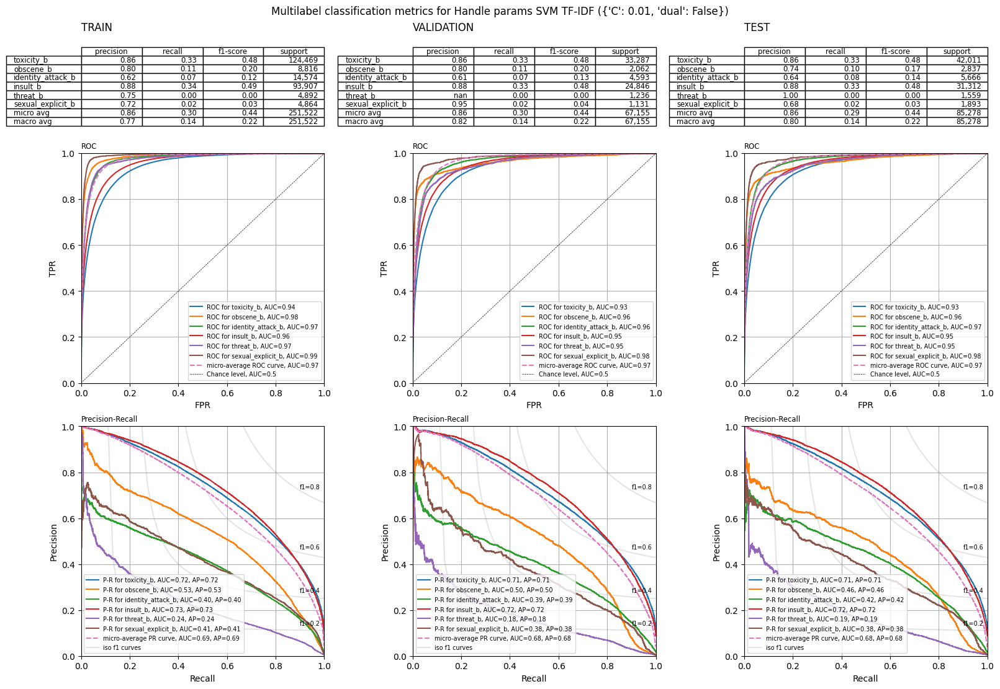

In [121]:
plot_metrics_multi(
    y_train,
    y_val,
    y_test,
    y_handle_params_svm_tfidf_pred_train,
    y_handle_params_svm_tfidf_pred_val,
    y_handle_params_svm_tfidf_pred_test,
    y_handle_params_svm_tfidf_pred_proba_train,
    y_handle_params_svm_tfidf_pred_proba_val,
    y_handle_params_svm_tfidf_pred_proba_test,
    y_train.columns,
    f'Handle params SVM TF-IDF ({svm_tfidf_handle_params})'
)

#### Наивный Байес

##### Слова

In [129]:
nb_tfidf_handle_params = {'alpha': 0.5}
(
    y_handle_params_nb_tfidf_pred_train,
    y_handle_params_nb_tfidf_pred_val,
    y_handle_params_nb_tfidf_pred_test,
    y_handle_params_nb_tfidf_pred_proba_train,
    y_handle_params_nb_tfidf_pred_proba_val,
    y_handle_params_nb_tfidf_pred_proba_test
) = train_and_predict_toxicity_multilabel(
    model=MultinomialNB(**nb_tfidf_handle_params),
    X_train=X_train_tfidf,
    X_val=X_val_tfidf,
    X_test=X_test_tfidf,
    y_train=y_train,
)

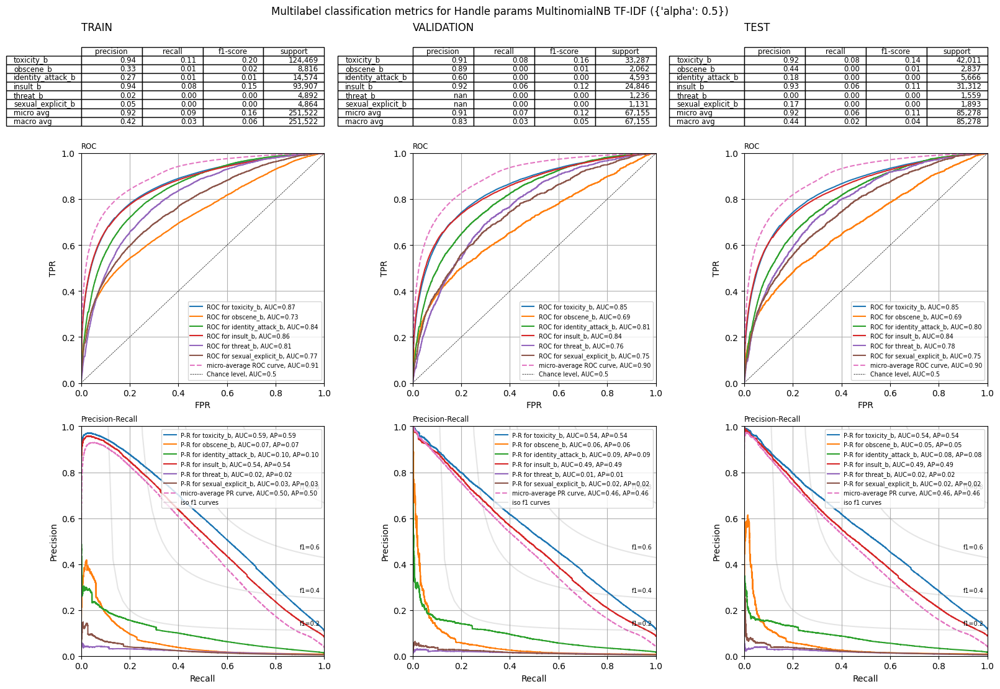

In [130]:
plot_metrics_multi(
    y_train,
    y_val,
    y_test,
    y_handle_params_nb_tfidf_pred_train,
    y_handle_params_nb_tfidf_pred_val,
    y_handle_params_nb_tfidf_pred_test,
    y_handle_params_nb_tfidf_pred_proba_train,
    y_handle_params_nb_tfidf_pred_proba_val,
    y_handle_params_nb_tfidf_pred_proba_test,
    y_train.columns,
    f'Handle params MultinomialNB TF-IDF ({nb_tfidf_handle_params})'
)

##### Биграммы

In [142]:
nb_tfidf_ngrams_handle_params = {'alpha': 0.7}
(
    y_handle_params_nb_tfidf_ngrams_pred_train,
    y_handle_params_nb_tfidf_ngrams_pred_val,
    y_handle_params_nb_tfidf_ngrams_pred_test,
    y_handle_params_nb_tfidf_ngrams_pred_proba_train,
    y_handle_params_nb_tfidf_ngrams_pred_proba_val,
    y_handle_params_nb_tfidf_ngrams_pred_proba_test
) = train_and_predict_toxicity_multilabel(
    model=MultinomialNB(**nb_tfidf_ngrams_handle_params),
    X_train=X_train_tfidf_ngrams,
    X_val=X_val_tfidf_ngrams,
    X_test=X_test_tfidf_ngrams,
    y_train=y_train,
)

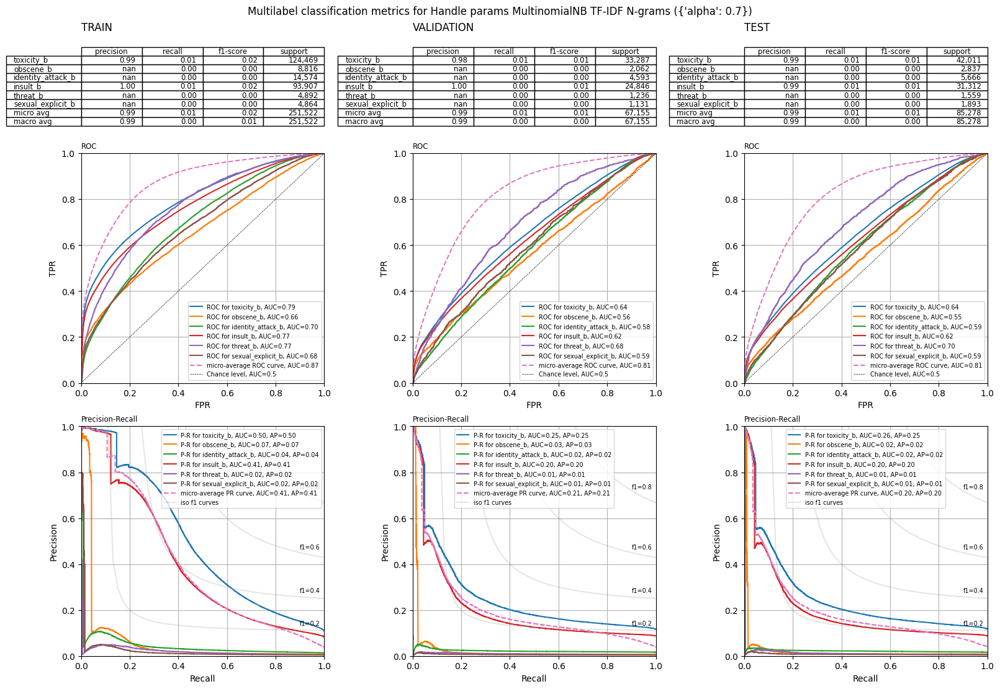

In [143]:
plot_metrics_multi(
    y_train,
    y_val,
    y_test,
    y_handle_params_nb_tfidf_ngrams_pred_train,
    y_handle_params_nb_tfidf_ngrams_pred_val,
    y_handle_params_nb_tfidf_ngrams_pred_test,
    y_handle_params_nb_tfidf_ngrams_pred_proba_train,
    y_handle_params_nb_tfidf_ngrams_pred_proba_val,
    y_handle_params_nb_tfidf_ngrams_pred_proba_test,
    y_train.columns,
    f'Handle params MultinomialNB TF-IDF N-grams ({nb_tfidf_ngrams_handle_params})'
)

## Обучение с подбором параметров

In [ ]:
def get_hyperparams(X_train, X_val, y_train, y_val, objective_func, n_trials=50):
    study = optuna.create_study(direction='maximize')
    study.optimize(partial(
        objective_func,
        X_train=X_train, X_val=X_val,
        y_train=y_train, y_val=y_val
    ), n_trials=n_trials)
    
    return study.best_params

In [148]:
def multi_label_log_reg_objective(trial, X_train, X_val, y_train, y_val):
    C = trial.suggest_float('C', 1e-5, 1, log=True)
    max_iter = trial.suggest_int('max_iter', 100, 1000)
    
    log_reg = LogisticRegression(C=C, max_iter=max_iter)
    clf = MultiOutputClassifier(log_reg, n_jobs=-1)
    clf.fit(X_train, y_train)
    
    y_pred = clf.predict(X_val)
    return f1_score(y_val, y_pred, average='micro')

def multi_label_svc_objective(trial, X_train, X_val, y_train, y_val):
    C = trial.suggest_float('C', 1e-5, 1, log=True)
    max_iter = trial.suggest_int('max_iter', 1000, 10000)
    
    svc = LinearSVC(C=C, max_iter=max_iter)
    clf = MultiOutputClassifier(svc, n_jobs=-1)
    clf.fit(X_train, y_train)
    
    y_pred = clf.predict(X_val)
    return f1_score(y_val, y_pred, average='micro')

def multi_label_mnb_objective(trial, X_train, X_val, y_train, y_val):
    alpha = trial.suggest_float('alpha', 1e-2, 1, log=True)
    
    mnb = MultinomialNB(alpha=alpha)
    clf = MultiOutputClassifier(mnb, n_jobs=-1)
    clf.fit(X_train, y_train)
    
    y_pred = clf.predict(X_val)
    return f1_score(y_val, y_pred, average='micro')

### Обучение с мешком слов

#### Логистическая регрессия

In [153]:
log_reg_bow_best_params = get_hyperparams(X_train_bow, X_val_bow, y_train, y_val, multi_label_log_reg_objective, n_trials=50)

[I 2024-12-07 00:57:45,097] A new study created in memory with name: no-name-4ea0de6e-83ac-4362-a451-2b24d884acd4
[I 2024-12-07 00:57:50,353] Trial 0 finished with value: 0.012635245841144256 and parameters: {'C': 9.381964771025775e-05, 'max_iter': 489}. Best is trial 0 with value: 0.012635245841144256.
[I 2024-12-07 00:58:04,745] Trial 1 finished with value: 0.5538224854264557 and parameters: {'C': 0.40618808304722825, 'max_iter': 735}. Best is trial 1 with value: 0.5538224854264557.
[I 2024-12-07 00:58:22,601] Trial 2 finished with value: 0.558899555182083 and parameters: {'C': 0.9579421506611369, 'max_iter': 737}. Best is trial 2 with value: 0.558899555182083.
[I 2024-12-07 00:58:25,662] Trial 3 finished with value: 0.019772019507609144 and parameters: {'C': 0.00012208187660169332, 'max_iter': 294}. Best is trial 2 with value: 0.558899555182083.
[I 2024-12-07 00:58:29,723] Trial 4 finished with value: 0.22079757438717304 and parameters: {'C': 0.0009965538225832418, 'max_iter': 652}.

In [154]:
(
    y_optuna_log_reg_bow_pred_train,
    y_optuna_log_reg_bow_pred_val,
    y_optuna_log_reg_bow_pred_test,
    y_optuna_log_reg_bow_pred_proba_train,
    y_optuna_log_reg_bow_pred_proba_val,
    y_optuna_log_reg_bow_pred_proba_test
) = train_and_predict_toxicity_multilabel(
    model=LogisticRegression(**log_reg_bow_best_params),
    X_train=X_train_bow,
    X_val=X_val_bow,
    X_test=X_test_bow,
    y_train=y_train,
)

/Users/lev_k/HSE/YP/.venv/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/lev_k/HSE/YP/.venv/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logis

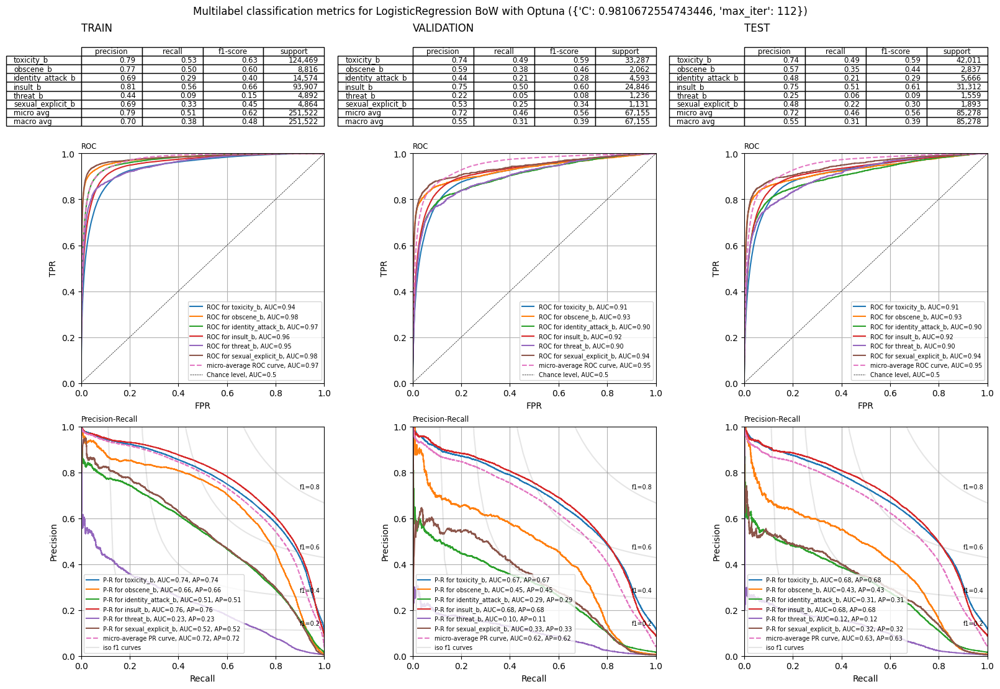

In [161]:
plot_metrics_multi(
    y_train,
    y_val,
    y_test,
    y_optuna_log_reg_bow_pred_train,
    y_optuna_log_reg_bow_pred_val,
    y_optuna_log_reg_bow_pred_test,
    y_optuna_log_reg_bow_pred_proba_train,
    y_optuna_log_reg_bow_pred_proba_val,
    y_optuna_log_reg_bow_pred_proba_test,
    y_train.columns,
    f'LogisticRegression BoW with Optuna ({log_reg_bow_best_params})'
)

#### SVM

In [155]:
svm_bow_best_params = get_hyperparams(X_train_bow, X_val_bow, y_train, y_val, multi_label_svc_objective, n_trials=50)

[I 2024-12-07 01:07:06,333] A new study created in memory with name: no-name-edadaf44-3eaf-4e09-b140-1719ea51c96e
[I 2024-12-07 01:07:14,223] Trial 0 finished with value: 0.061887008890163464 and parameters: {'C': 2.927421091346096e-05, 'max_iter': 7849}. Best is trial 0 with value: 0.061887008890163464.
[I 2024-12-07 01:07:22,202] Trial 1 finished with value: 0.09483812065454035 and parameters: {'C': 4.1671803812287444e-05, 'max_iter': 2514}. Best is trial 1 with value: 0.09483812065454035.
[I 2024-12-07 01:07:33,185] Trial 2 finished with value: 0.32220720666850045 and parameters: {'C': 0.00026080394469328946, 'max_iter': 9469}. Best is trial 2 with value: 0.32220720666850045.
[I 2024-12-07 01:07:40,683] Trial 3 finished with value: 0.06742793442997813 and parameters: {'C': 3.1179647552887384e-05, 'max_iter': 8280}. Best is trial 2 with value: 0.32220720666850045.
[I 2024-12-07 01:07:46,757] Trial 4 finished with value: 0.01384624468587624 and parameters: {'C': 1.2164801427218979e-05

In [156]:
(
    y_optuna_svm_bow_pred_train,
    y_optuna_svm_bow_pred_val,
    y_optuna_svm_bow_pred_test,
    y_optuna_svm_bow_pred_proba_train,
    y_optuna_svm_bow_pred_proba_val,
    y_optuna_svm_bow_pred_proba_test
) = train_and_predict_toxicity_multilabel(
    model=LinearSVC(**svm_bow_best_params),
    X_train=X_train_bow,
    X_val=X_val_bow,
    X_test=X_test_bow,
    y_train=y_train,
)

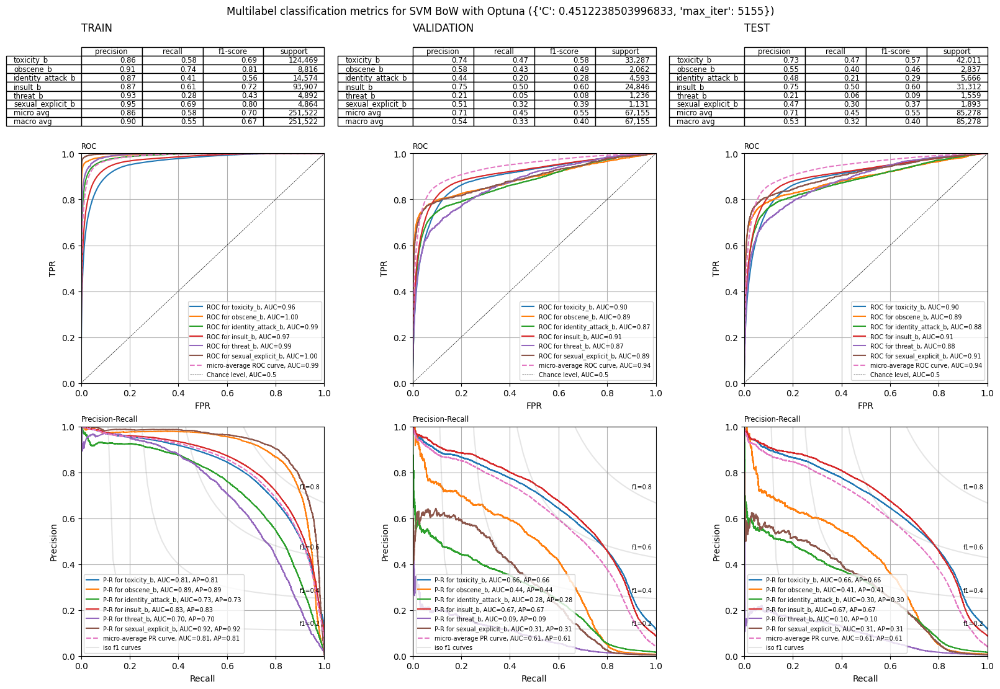

In [162]:
plot_metrics_multi(
    y_train,
    y_val,
    y_test,
    y_optuna_svm_bow_pred_train,
    y_optuna_svm_bow_pred_val,
    y_optuna_svm_bow_pred_test,
    y_optuna_svm_bow_pred_proba_train,
    y_optuna_svm_bow_pred_proba_val,
    y_optuna_svm_bow_pred_proba_test,
    y_train.columns,
    f'SVM BoW with Optuna ({svm_bow_best_params})'
)

#### Наивный Байес

##### Слова

In [157]:
nb_bow_best_params = get_hyperparams(X_train_bow, X_val_bow, y_train, y_val, multi_label_mnb_objective, n_trials=50)

[I 2024-12-07 02:53:16,989] A new study created in memory with name: no-name-a3379fac-7eff-49b8-b56e-61ac57a02337
[I 2024-12-07 02:53:18,256] Trial 0 finished with value: 0.46931792343483975 and parameters: {'alpha': 0.07605454385405847}. Best is trial 0 with value: 0.46931792343483975.
[I 2024-12-07 02:53:19,507] Trial 1 finished with value: 0.46511602246521533 and parameters: {'alpha': 0.04737047274816167}. Best is trial 0 with value: 0.46931792343483975.
[I 2024-12-07 02:53:20,766] Trial 2 finished with value: 0.47228339239204553 and parameters: {'alpha': 0.10809057501073056}. Best is trial 2 with value: 0.47228339239204553.
[I 2024-12-07 02:53:22,023] Trial 3 finished with value: 0.469491694683932 and parameters: {'alpha': 0.0777802793787041}. Best is trial 2 with value: 0.47228339239204553.
[I 2024-12-07 02:53:23,249] Trial 4 finished with value: 0.4719478764802108 and parameters: {'alpha': 0.10333070064822328}. Best is trial 2 with value: 0.47228339239204553.
[I 2024-12-07 02:53:

In [158]:
(
    y_optuna_nb_bow_pred_train,
    y_optuna_nb_bow_pred_val,
    y_optuna_nb_bow_pred_test,
    y_optuna_nb_bow_pred_proba_train,
    y_optuna_nb_bow_pred_proba_val,
    y_optuna_nb_bow_pred_proba_test
) = train_and_predict_toxicity_multilabel(
    model=MultinomialNB(**nb_bow_best_params),
    X_train=X_train_bow,
    X_val=X_val_bow,
    X_test=X_test_bow,
    y_train=y_train,
)

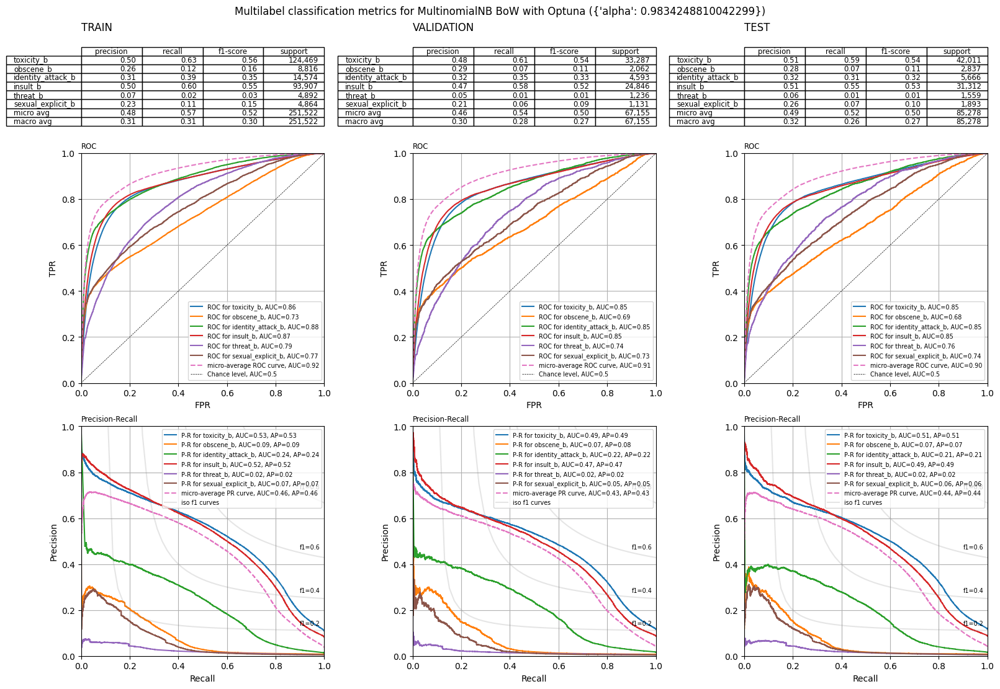

In [163]:
plot_metrics_multi(
    y_train,
    y_val,
    y_test,
    y_optuna_nb_bow_pred_train,
    y_optuna_nb_bow_pred_val,
    y_optuna_nb_bow_pred_test,
    y_optuna_nb_bow_pred_proba_train,
    y_optuna_nb_bow_pred_proba_val,
    y_optuna_nb_bow_pred_proba_test,
    y_train.columns,
    f'MultinomialNB BoW with Optuna ({nb_bow_best_params})'
)

##### Биграммы

In [159]:
nb_bow_ngrams_best_params = get_hyperparams(X_train_bow_ngrams, X_val_bow_ngrams, y_train, y_val, multi_label_mnb_objective, n_trials=50)

[I 2024-12-07 02:54:22,785] A new study created in memory with name: no-name-393a6f01-e197-41fb-862f-e6ce47bc2190
[I 2024-12-07 02:54:33,210] Trial 0 finished with value: 0.3735872659822276 and parameters: {'alpha': 0.4287035352432803}. Best is trial 0 with value: 0.3735872659822276.
[I 2024-12-07 02:54:40,560] Trial 1 finished with value: 0.17634644154733917 and parameters: {'alpha': 0.9464941205295907}. Best is trial 0 with value: 0.3735872659822276.
[I 2024-12-07 02:54:47,940] Trial 2 finished with value: 0.4594244976571708 and parameters: {'alpha': 0.06133917873159723}. Best is trial 2 with value: 0.4594244976571708.
[I 2024-12-07 02:54:55,602] Trial 3 finished with value: 0.3115991441134285 and parameters: {'alpha': 0.5601533414508552}. Best is trial 2 with value: 0.4594244976571708.
[I 2024-12-07 02:55:02,750] Trial 4 finished with value: 0.43719028110287217 and parameters: {'alpha': 0.0245450983261159}. Best is trial 2 with value: 0.4594244976571708.
[I 2024-12-07 02:55:09,878] 

In [160]:
(
    y_optuna_nb_bow_ngrams_pred_train,
    y_optuna_nb_bow_ngrams_pred_val,
    y_optuna_nb_bow_ngrams_pred_test,
    y_optuna_nb_bow_ngrams_pred_proba_train,
    y_optuna_nb_bow_ngrams_pred_proba_val,
    y_optuna_nb_bow_ngrams_pred_proba_test
) = train_and_predict_toxicity_multilabel(
    model=MultinomialNB(**nb_bow_ngrams_best_params),
    X_train=X_train_bow_ngrams,
    X_val=X_val_bow_ngrams,
    X_test=X_test_bow_ngrams,
    y_train=y_train,
)

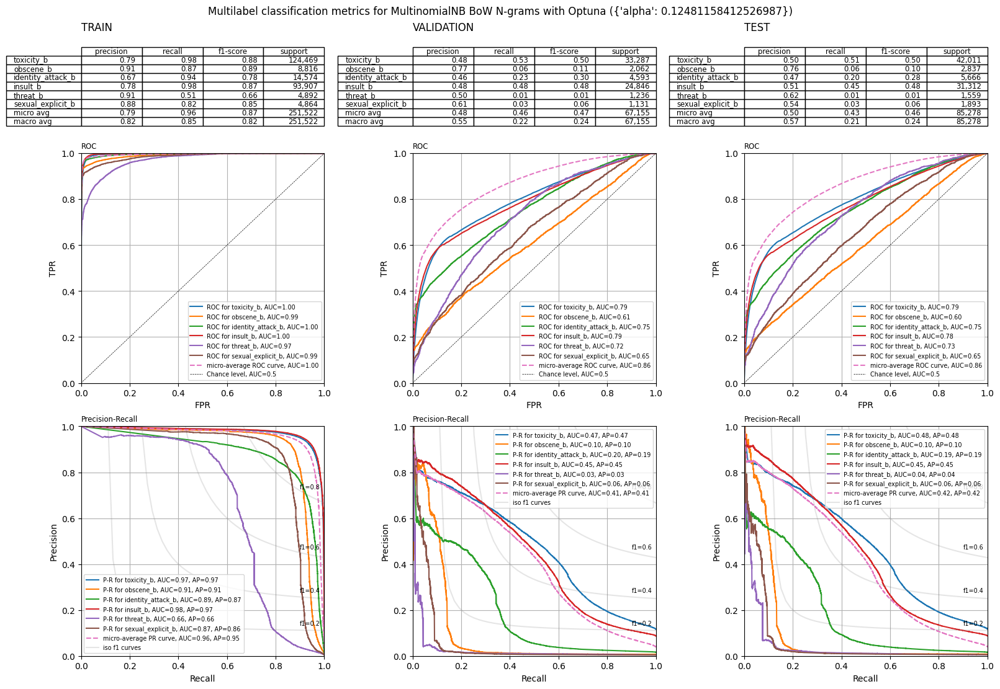

In [164]:
plot_metrics_multi(
    y_train,
    y_val,
    y_test,
    y_optuna_nb_bow_ngrams_pred_train,
    y_optuna_nb_bow_ngrams_pred_val,
    y_optuna_nb_bow_ngrams_pred_test,
    y_optuna_nb_bow_ngrams_pred_proba_train,
    y_optuna_nb_bow_ngrams_pred_proba_val,
    y_optuna_nb_bow_ngrams_pred_proba_test,
    y_train.columns,
    f'MultinomialNB BoW N-grams with Optuna ({nb_bow_ngrams_best_params})'
)

### Обучение с TF-IDF

#### Логистическая регрессия

In [165]:
log_reg_tfidf_best_params = get_hyperparams(X_train_tfidf, X_val_tfidf, y_train, y_val, multi_label_log_reg_objective, n_trials=50)

[I 2024-12-07 03:04:27,046] A new study created in memory with name: no-name-65574509-b793-4f62-953d-22392124e09c
[I 2024-12-07 03:04:32,634] Trial 0 finished with value: 0.3249966629048503 and parameters: {'C': 0.03417294049743109, 'max_iter': 478}. Best is trial 0 with value: 0.3249966629048503.
[I 2024-12-07 03:04:34,813] Trial 1 finished with value: 0.0 and parameters: {'C': 5.865265802207369e-05, 'max_iter': 874}. Best is trial 0 with value: 0.3249966629048503.
[I 2024-12-07 03:04:38,010] Trial 2 finished with value: 0.0016366612111292963 and parameters: {'C': 0.0018400115985782394, 'max_iter': 184}. Best is trial 0 with value: 0.3249966629048503.
[I 2024-12-07 03:04:42,248] Trial 3 finished with value: 0.1728385057936958 and parameters: {'C': 0.014050316850718982, 'max_iter': 206}. Best is trial 0 with value: 0.3249966629048503.
[I 2024-12-07 03:04:45,941] Trial 4 finished with value: 0.11335227670385353 and parameters: {'C': 0.009714072596754386, 'max_iter': 628}. Best is trial 

In [166]:
(
    y_optuna_log_reg_tfidf_pred_train,
    y_optuna_log_reg_tfidf_pred_val,
    y_optuna_log_reg_tfidf_pred_test,
    y_optuna_log_reg_tfidf_pred_proba_train,
    y_optuna_log_reg_tfidf_pred_proba_val,
    y_optuna_log_reg_tfidf_pred_proba_test
) = train_and_predict_toxicity_multilabel(
    model=LogisticRegression(**log_reg_tfidf_best_params),
    X_train=X_train_tfidf,
    X_val=X_val_tfidf,
    X_test=X_test_tfidf,
    y_train=y_train,
)

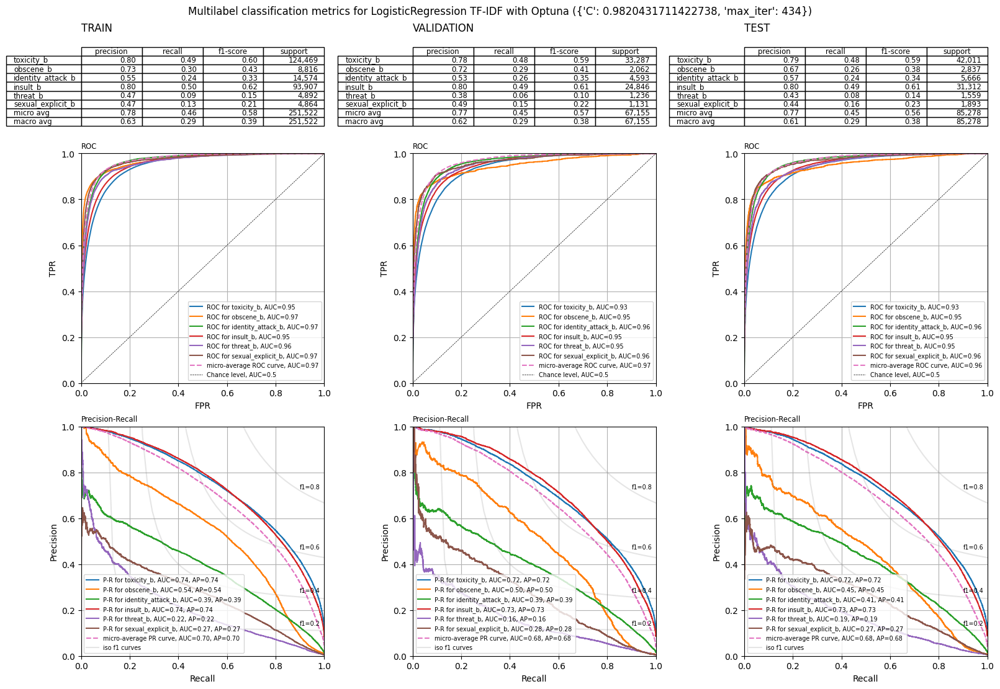

In [173]:
plot_metrics_multi(
    y_train,
    y_val,
    y_test,
    y_optuna_log_reg_tfidf_pred_train,
    y_optuna_log_reg_tfidf_pred_val,
    y_optuna_log_reg_tfidf_pred_test,
    y_optuna_log_reg_tfidf_pred_proba_train,
    y_optuna_log_reg_tfidf_pred_proba_val,
    y_optuna_log_reg_tfidf_pred_proba_test,
    y_train.columns,
    f'LogisticRegression TF-IDF with Optuna ({log_reg_tfidf_best_params})'
)

#### SVM

In [167]:
svm_tfidf_best_params = get_hyperparams(X_train_tfidf, X_val_tfidf, y_train, y_val, multi_label_svc_objective, n_trials=50)

[I 2024-12-07 03:08:55,367] A new study created in memory with name: no-name-babf5c05-3f4e-4cac-9233-13a8bf879b67
[I 2024-12-07 03:08:59,999] Trial 0 finished with value: 0.000863300785901405 and parameters: {'C': 0.00014363640569853048, 'max_iter': 4086}. Best is trial 0 with value: 0.000863300785901405.
[I 2024-12-07 03:09:07,053] Trial 1 finished with value: 0.3232841878774542 and parameters: {'C': 0.003644923067509568, 'max_iter': 2623}. Best is trial 1 with value: 0.3232841878774542.
[I 2024-12-07 03:09:10,035] Trial 2 finished with value: 0.0 and parameters: {'C': 1.3939141731252175e-05, 'max_iter': 1545}. Best is trial 1 with value: 0.3232841878774542.
[I 2024-12-07 03:09:16,993] Trial 3 finished with value: 0.37256793318433123 and parameters: {'C': 0.005205024036431509, 'max_iter': 2184}. Best is trial 3 with value: 0.37256793318433123.
[I 2024-12-07 03:09:21,462] Trial 4 finished with value: 0.025572064723777613 and parameters: {'C': 0.00043793713227180636, 'max_iter': 2651}. 

In [168]:
(
    y_optuna_svm_tfidf_pred_train,
    y_optuna_svm_tfidf_pred_val,
    y_optuna_svm_tfidf_pred_test,
    y_optuna_svm_tfidf_pred_proba_train,
    y_optuna_svm_tfidf_pred_proba_val,
    y_optuna_svm_tfidf_pred_proba_test
) = train_and_predict_toxicity_multilabel(
    model=LinearSVC(**svm_tfidf_best_params),
    X_train=X_train_tfidf,
    X_val=X_val_tfidf,
    X_test=X_test_tfidf,
    y_train=y_train,
)

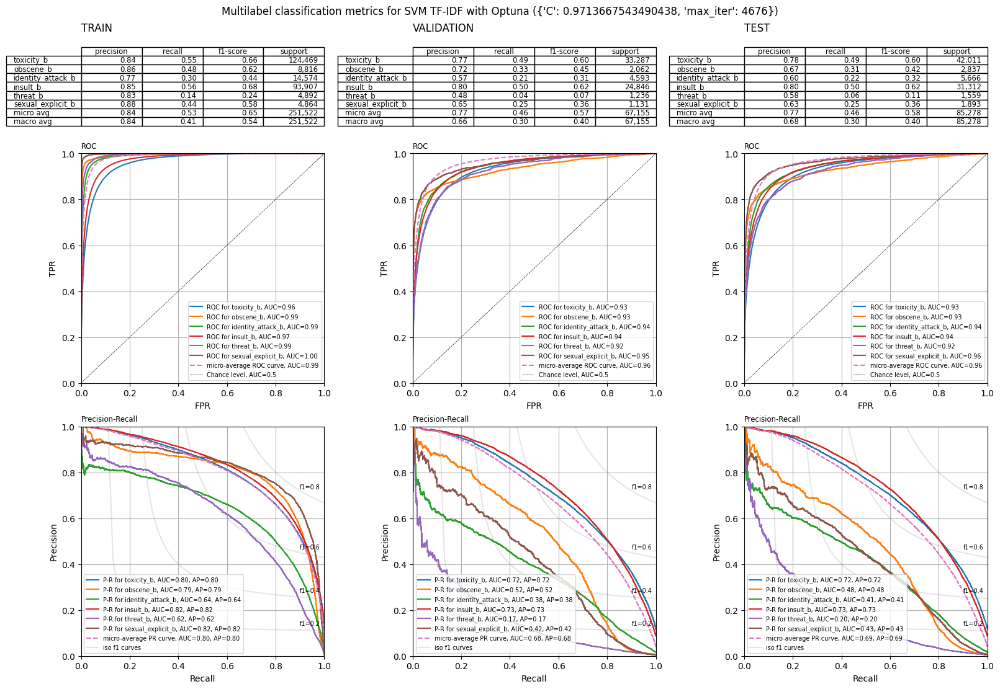

In [174]:
plot_metrics_multi(
    y_train,
    y_val,
    y_test,
    y_optuna_svm_tfidf_pred_train,
    y_optuna_svm_tfidf_pred_val,
    y_optuna_svm_tfidf_pred_test,
    y_optuna_svm_tfidf_pred_proba_train,
    y_optuna_svm_tfidf_pred_proba_val,
    y_optuna_svm_tfidf_pred_proba_test,
    y_train.columns,
    f'SVM TF-IDF with Optuna ({svm_tfidf_best_params})'
)

#### Наивный Байес

##### Слова

In [169]:
nb_tfidf_best_params = get_hyperparams(X_train_tfidf, X_val_tfidf, y_train, y_val, multi_label_mnb_objective, n_trials=50)

[I 2024-12-07 03:20:58,136] A new study created in memory with name: no-name-5567df00-d48b-4afd-bcb2-9729d9d08da2
[I 2024-12-07 03:20:59,126] Trial 0 finished with value: 0.08563759533040774 and parameters: {'alpha': 0.8690083999835619}. Best is trial 0 with value: 0.08563759533040774.
[I 2024-12-07 03:21:00,147] Trial 1 finished with value: 0.20228333791047118 and parameters: {'alpha': 0.019796684328652635}. Best is trial 1 with value: 0.20228333791047118.
[I 2024-12-07 03:21:01,262] Trial 2 finished with value: 0.1831865833677452 and parameters: {'alpha': 0.11340847918980211}. Best is trial 1 with value: 0.20228333791047118.
[I 2024-12-07 03:21:02,220] Trial 3 finished with value: 0.19945900519985293 and parameters: {'alpha': 0.036930742613212456}. Best is trial 1 with value: 0.20228333791047118.
[I 2024-12-07 03:21:03,241] Trial 4 finished with value: 0.20342123461944964 and parameters: {'alpha': 0.01130754276234004}. Best is trial 4 with value: 0.20342123461944964.
[I 2024-12-07 03

In [170]:
(
    y_optuna_nb_tfidf_pred_train,
    y_optuna_nb_tfidf_pred_val,
    y_optuna_nb_tfidf_pred_test,
    y_optuna_nb_tfidf_pred_proba_train,
    y_optuna_nb_tfidf_pred_proba_val,
    y_optuna_nb_tfidf_pred_proba_test
) = train_and_predict_toxicity_multilabel(
    model=MultinomialNB(**nb_tfidf_best_params),
    X_train=X_train_tfidf,
    X_val=X_val_tfidf,
    X_test=X_test_tfidf,
    y_train=y_train,
)

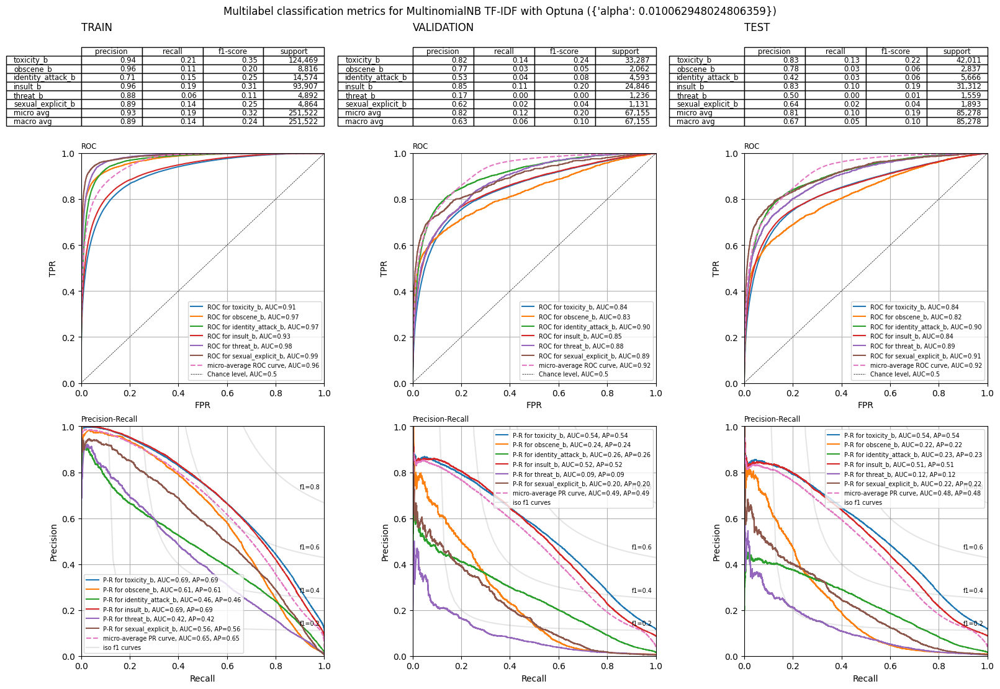

In [175]:
plot_metrics_multi(
    y_train,
    y_val,
    y_test,
    y_optuna_nb_tfidf_pred_train,
    y_optuna_nb_tfidf_pred_val,
    y_optuna_nb_tfidf_pred_test,
    y_optuna_nb_tfidf_pred_proba_train,
    y_optuna_nb_tfidf_pred_proba_val,
    y_optuna_nb_tfidf_pred_proba_test,
    y_train.columns,
    f'MultinomialNB TF-IDF with Optuna ({nb_tfidf_best_params})'
)

##### Биграммы

In [171]:
nb_tfidf_ngrams_best_params = get_hyperparams(X_train_tfidf_ngrams, X_val_tfidf_ngrams, y_train, y_val, multi_label_mnb_objective, n_trials=50)

[I 2024-12-07 03:21:57,255] A new study created in memory with name: no-name-a022626a-6f1f-4383-9412-5a5635602354
[I 2024-12-07 03:22:09,763] Trial 0 finished with value: 0.25517198636504496 and parameters: {'alpha': 0.028155022617816664}. Best is trial 0 with value: 0.25517198636504496.
[I 2024-12-07 03:22:17,631] Trial 1 finished with value: 0.015013373132563948 and parameters: {'alpha': 0.5055572435318164}. Best is trial 0 with value: 0.25517198636504496.
[I 2024-12-07 03:22:24,788] Trial 2 finished with value: 0.29119415301190615 and parameters: {'alpha': 0.014042095057714128}. Best is trial 2 with value: 0.29119415301190615.
[I 2024-12-07 03:22:31,930] Trial 3 finished with value: 0.0087175685693106 and parameters: {'alpha': 0.8490654071972933}. Best is trial 2 with value: 0.29119415301190615.
[I 2024-12-07 03:22:39,590] Trial 4 finished with value: 0.13043478260869565 and parameters: {'alpha': 0.08349269350691034}. Best is trial 2 with value: 0.29119415301190615.
[I 2024-12-07 03

In [172]:
(
    y_optuna_nb_tfidf_ngrams_pred_train,
    y_optuna_nb_tfidf_ngrams_pred_val,
    y_optuna_nb_tfidf_ngrams_pred_test,
    y_optuna_nb_tfidf_ngrams_pred_proba_train,
    y_optuna_nb_tfidf_ngrams_pred_proba_val,
    y_optuna_nb_tfidf_ngrams_pred_proba_test
) = train_and_predict_toxicity_multilabel(
    model=MultinomialNB(**nb_tfidf_ngrams_best_params),
    X_train=X_train_tfidf_ngrams,
    X_val=X_val_tfidf_ngrams,
    X_test=X_test_tfidf_ngrams,
    y_train=y_train,
)

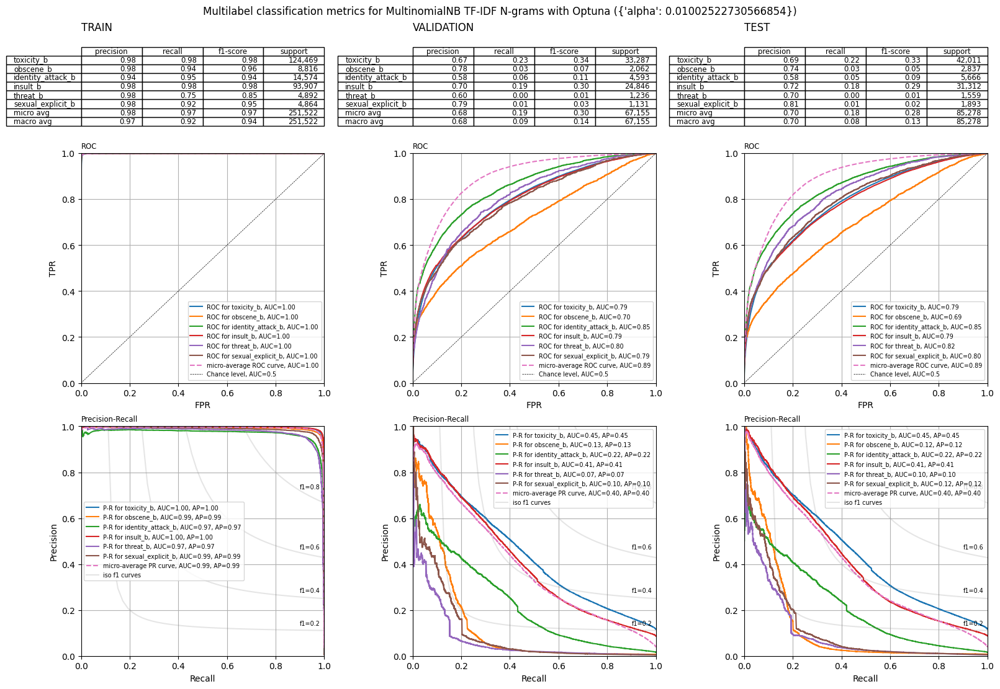

In [176]:
plot_metrics_multi(
    y_train,
    y_val,
    y_test,
    y_optuna_nb_tfidf_ngrams_pred_train,
    y_optuna_nb_tfidf_ngrams_pred_val,
    y_optuna_nb_tfidf_ngrams_pred_test,
    y_optuna_nb_tfidf_ngrams_pred_proba_train,
    y_optuna_nb_tfidf_ngrams_pred_proba_val,
    y_optuna_nb_tfidf_ngrams_pred_proba_test,
    y_train.columns,
    f'MultinomialNB TF-IDF N-grams with Optuna ({nb_tfidf_ngrams_best_params})'
)